## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import shutil
import scipy
import scipy.sparse.linalg
from skimage.color import rgb2gray
from skimage import io

# modify to where you store your project data including utils.py
datadir = r"C:\Users\ijise\Desktop\cs445\project3\mp3"

""" utilfn = os.path.join(datadir, "utils.py")
samplesfn = os.path.join(datadir, "samples")
shutil.copy(utilfn, ".") 
shutil.copytree(samplesfn, "./samples")  """
import utils

## Part 1 Toy Problem (20 pts)

In [3]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    # TO DO
    height, width = img.shape
    im2var = np.arange(height * width).reshape(height, width)
    
    #  sparse matrix, target vector
    num = (width - 1) * height + (height - 1) * width + 1

    A = scipy.sparse.lil_matrix((num, height * width), dtype=np.float32)
    b = np.zeros(num, dtype=np.float32)

    e = 0
    
    # gradient x
    for y in range(height):
        for x in range(width - 1):
            A[e, im2var[y, x + 1]] = 1    
            A[e, im2var[y, x]] = -1      
            b[e] = img[y, x + 1] - img[y, x]  
            e += 1

    # gradient y
    for y in range(height - 1):
        for x in range(width):
            A[e, im2var[y + 1, x]] = 1   
            A[e, im2var[y, x]] = -1      
            b[e] = img[y + 1, x] - img[y, x]  
            e += 1


    # intensity (v(1,1) = s(1,1))
    A[e, im2var[-1, -1]] = 1
    b[e] = img[0, 0]
    
    # least squares 
    x = scipy.sparse.linalg.lsqr(A.tocsr(), b)[0]
    
    # result image
    res = x.reshape((height, width))
    return res
    

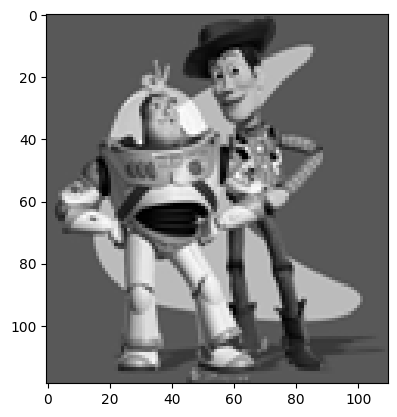

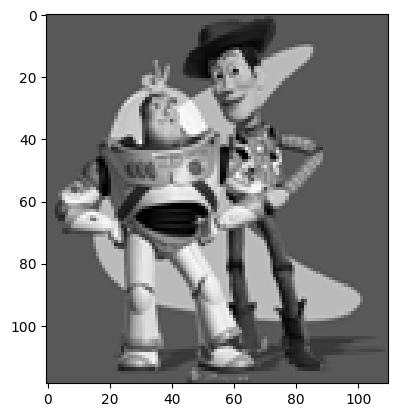

Max error is:  0.0009477229279480914


In [4]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")
plt.show()

im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

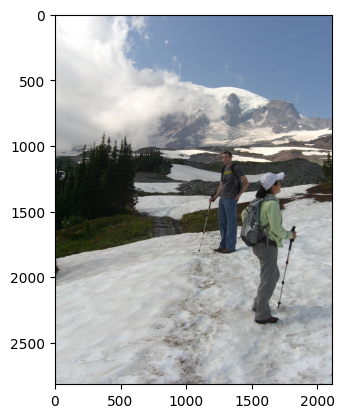

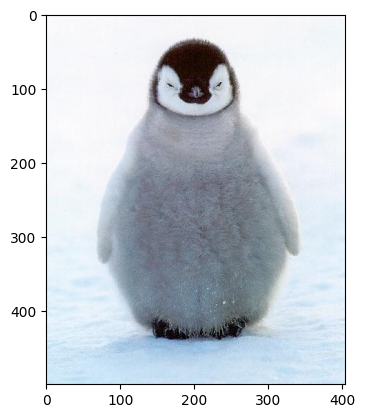

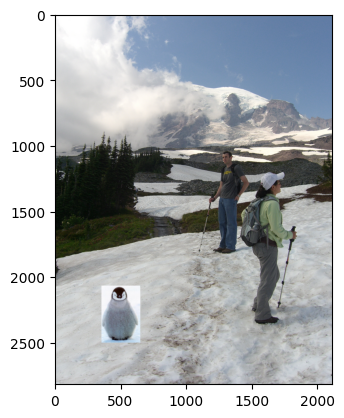

In [5]:
background_img = cv2.cvtColor(cv2.imread('samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (500, 2500) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



In [6]:
if use_interface:
  import matplotlib.pyplot as plt
  %matplotlib notebook
  mask_coords = specify_mask(object_img)

In [7]:
if use_interface:
  xs = mask_coords[0]
  ys = mask_coords[1]
  %matplotlib inline
  import matplotlib.pyplot as plt
  plt.figure()
  object_mask = get_mask(ys, xs, object_img)

In [8]:
if use_interface:
  %matplotlib notebook
  import matplotlib.pyplot as plt
  bottom_center = specify_bottom_center(background_img)

In [9]:
if use_interface:
  %matplotlib inline
  import matplotlib.pyplot as plt

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

## Part 2 Poisson Blending (50 pts)

In [10]:
def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    #TO DO 

    obj_h, obj_w = object_img.shape[:2]
    ult = bg_img[bg_ul[0]:bg_ul[0] + obj_h, bg_ul[1]:bg_ul[1] + obj_w]

    res = bg_img.copy()

    #im2var matrix
    im2var = np.arange(obj_h * obj_w).reshape(obj_h, obj_w)
    
    num = (obj_w - 1) * obj_h + (obj_h - 1) * obj_w + 1
    A = scipy.sparse.lil_matrix((num, obj_w *obj_h), dtype=np.float32)
    b = np.zeros(num, dtype=np.float32)
    
    e = 0
    
    # x
    for y in range(obj_h):
        for x in range(obj_w - 1):
            e += 1
            A[e, im2var[y, x + 1]] = 1 
            if object_mask[y, x] and object_mask[y, x + 1]: 
                A[e, im2var[y, x]] = -1
                b[e] = object_img[y, x + 1] - object_img[y, x]
            # edge
            else: 
                b[e] = object_img[y, x + 1] - object_img[y, x] + ult[y, x]
    
    #y
    for y in range(obj_h - 1):
        for x in range(obj_w):
            e += 1
            A[e, im2var[y + 1, x]] = 1 
            if object_mask[y, x] and object_mask[y + 1, x]:  #
                A[e, im2var[y, x]] = -1
                b[e] = object_img[y + 1, x] - object_img[y, x]
            #edge
            else:
                b[e] = object_img[y + 1, x] - object_img[y, x] + ult[y, x]

    # least squares
    temp = scipy.sparse.linalg.lsqr(A.tocsr(), b)[0].reshape(obj_h, obj_w)
    
    # result imagee
    res[bg_ul[0]:bg_ul[0] + obj_h, bg_ul[1]:bg_ul[1] + obj_w] = temp
                
    return res


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20059087110739737..1.0].


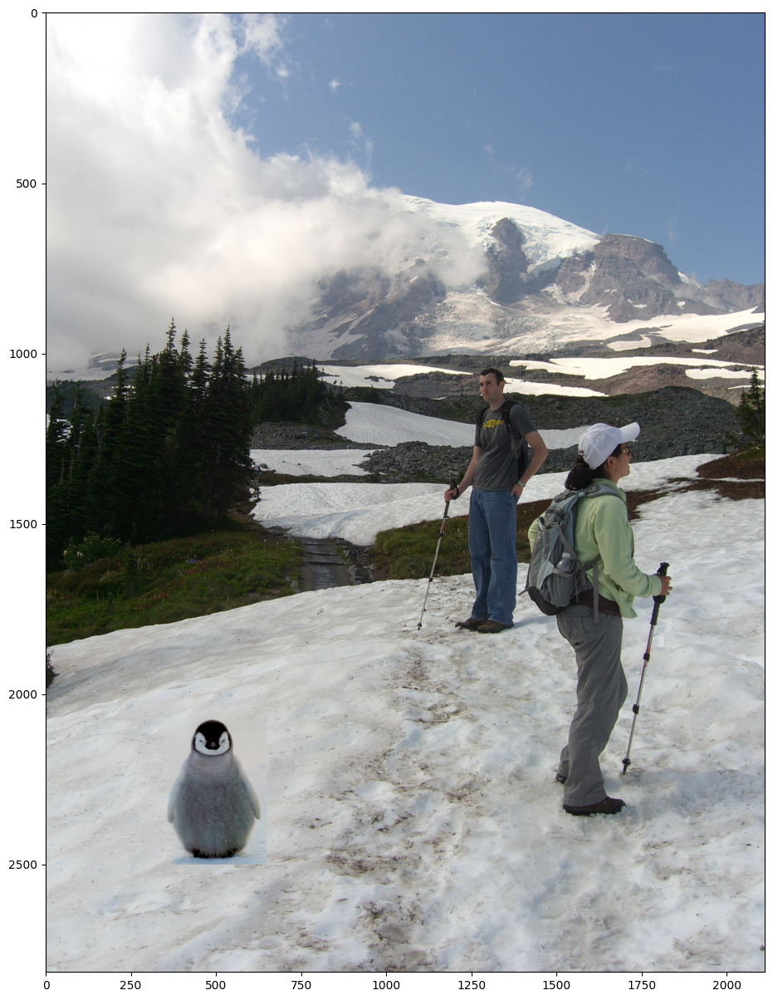

In [11]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

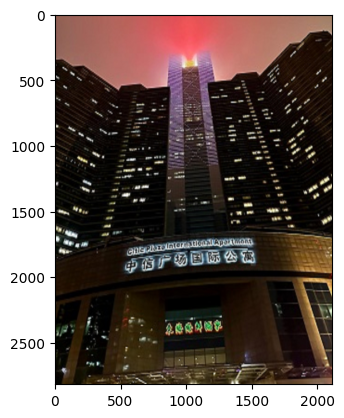

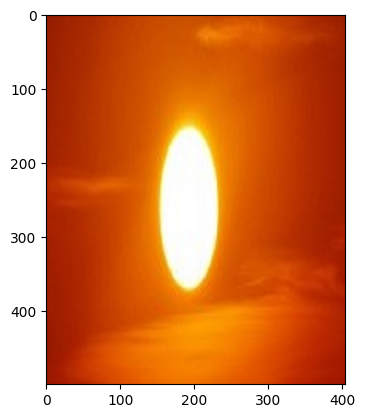

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007843134101121417..1.3384008444333162].


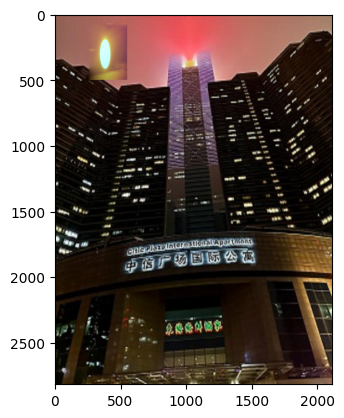

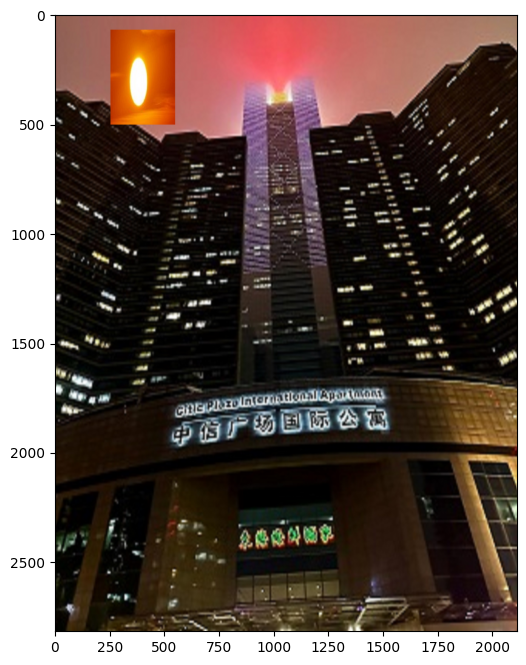

In [12]:
# good blend
background_img3 = cv2.cvtColor(cv2.imread('samples/quilt2.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img3)
plt.show()
object_img3 = cv2.cvtColor(cv2.imread('samples/redsun.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img3)
plt.show()

xs3 = (65, 359, 359, 65)
ys3 = (24, 24, 457, 457)
object_mask3 = utils.get_mask(ys3, xs3, object_img3)
bottom_center3 = (400, 500)  

object_img3, object_mask3 = utils.crop_object_img(object_img3, object_mask3)
bg_ul3 = utils.upper_left_background_rc(object_mask3, bottom_center3)

im_blend3 = np.zeros(background_img3.shape)
for b in np.arange(3):
  im_blend3[:,:,b] = poisson_blend(object_img3[:,:,b], object_mask3, background_img3[:,:,b].copy(), bg_ul3)
plt.imshow(im_blend3)

pasted_img3 = utils.get_combined_img(background_img3, object_img3, object_mask3, bg_ul3)
plt.figure(figsize=(8,8))
plt.imshow(pasted_img3)



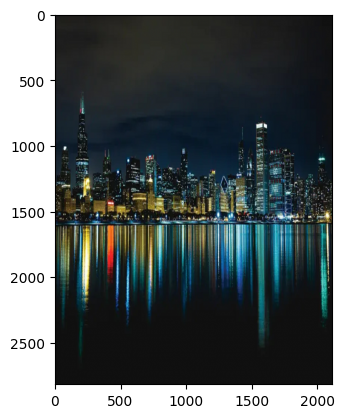

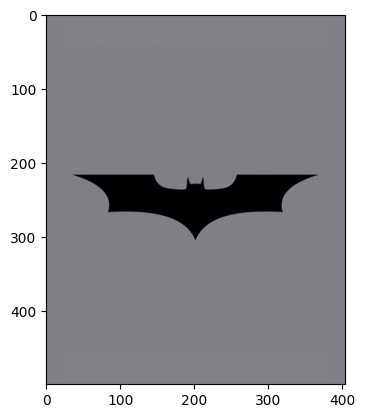

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3870930724982493..1.0].


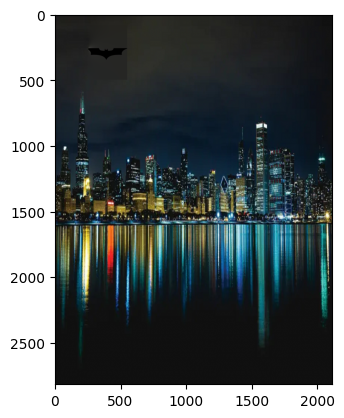

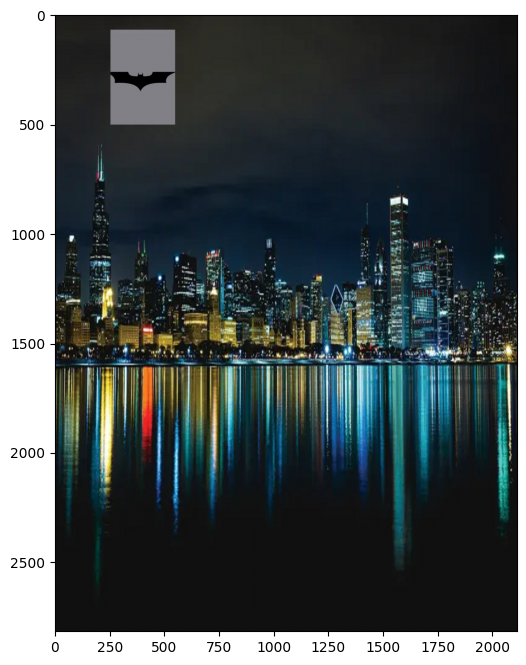

In [13]:
# good blend #2
background_img4 = cv2.cvtColor(cv2.imread('samples/chicago.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img4)
plt.show()
object_img4 = cv2.cvtColor(cv2.imread('samples/batman.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img4)
plt.show()

xs4 = (65, 359, 359, 65)
ys4 = (24, 24, 457, 457)
object_mask4 = utils.get_mask(ys4, xs4, object_img4)
bottom_center4 = (400, 500)  

object_img4, object_mask4 = utils.crop_object_img(object_img4, object_mask4)
bg_ul4 = utils.upper_left_background_rc(object_mask4, bottom_center4)

im_blend4 = np.zeros(background_img4.shape)
for b in np.arange(3):
  im_blend4[:,:,b] = poisson_blend(object_img4[:,:,b], object_mask4, background_img4[:,:,b].copy(), bg_ul4)
plt.imshow(im_blend4)

pasted_img4 = utils.get_combined_img(background_img4, object_img4, object_mask4, bg_ul4)
plt.figure(figsize=(8,8))
plt.imshow(pasted_img4)



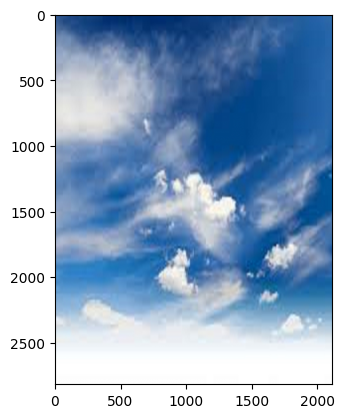

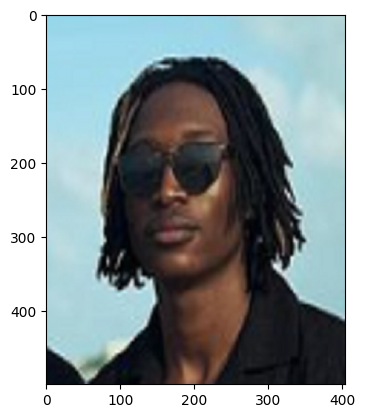

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34721170598449014..1.0].


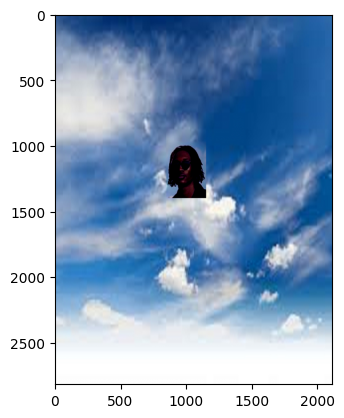

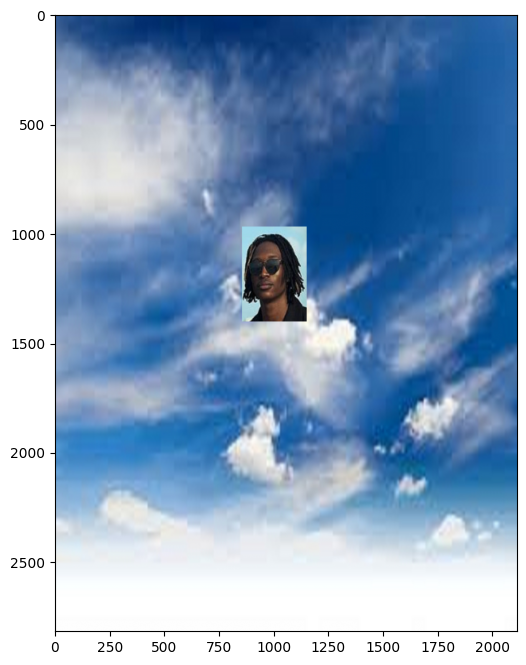

In [14]:
# bad blend
background_img2 = cv2.cvtColor(cv2.imread('samples/sky.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img2)
plt.show()
object_img2 = cv2.cvtColor(cv2.imread('samples/guid4.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img2)
plt.show()

xs2 = (65, 359, 359, 65)
ys2 = (24, 24, 457, 457)
object_mask2 = utils.get_mask(ys2, xs2, object_img2)
bottom_center2 = (1000, 1400)  

object_img2, object_mask2 = utils.crop_object_img(object_img2, object_mask2)
bg_ul2 = utils.upper_left_background_rc(object_mask2, bottom_center2)

im_blend2 = np.zeros(background_img2.shape)
for b in np.arange(3):
  im_blend2[:,:,b] = poisson_blend(object_img2[:,:,b], object_mask2, background_img2[:,:,b].copy(), bg_ul2)
plt.imshow(im_blend2)

pasted_img2 = utils.get_combined_img(background_img2, object_img2, object_mask2, bg_ul2)
plt.figure(figsize=(8,8))
plt.imshow(pasted_img2)



## Part 3 Mixed Gradients (20 pts)

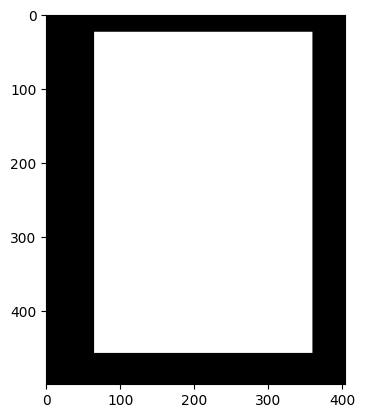

In [15]:
background_img = cv2.cvtColor(cv2.imread('samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 


use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (500, 2500) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)



In [16]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    #TO DO 

    obj_h, obj_w = object_img.shape[:2]
    ult = bg_img[bg_ul[0]:bg_ul[0] + obj_h, bg_ul[1]:bg_ul[1] + obj_w]

    res = bg_img.copy()
    im2var = np.arange(obj_h * obj_w).reshape(obj_h, obj_w)
    num = (obj_w - 1) * obj_h + (obj_h - 1) * obj_w

    A = scipy.sparse.lil_matrix((num, obj_h * obj_w), dtype=np.float32)
    b = np.zeros(num, dtype=np.float32)
    
    e = 0  
    
    # X
    for y in range(obj_h):
        for x in range(obj_w - 1):
            A[e, im2var[y, x + 1]] = 1 
            if object_mask[y, x] and object_mask[y, x + 1]: 
                A[e, im2var[y, x]] = -1
                src = object_img[y, x + 1] - object_img[y, x]
                grad = ult[y, x + 1] - ult[y, x]
                if abs(src) > abs(grad):
                    b[e] = src
                else:
                    b[e] = grad
            else: 
                b[e] = object_img[y, x + 1] - object_img[y, x] + ult[y, x]
            e += 1
    
    # Y
    for y in range(obj_h - 1):
        for x in range(obj_w):
            A[e, im2var[y + 1, x]] = 1 
            if object_mask[y, x] and object_mask[y + 1, x]: 
                A[e, im2var[y, x]] = -1
                src = object_img[y + 1, x] - object_img[y, x]
                grad = ult[y + 1, x] - ult[y, x]
                if abs(src) > abs(grad):
                    b[e] = src
                else:
                    b[e] = grad
            else:
                b[e] = object_img[y + 1, x] - object_img[y, x] + ult[y, x]
            e += 1

    # least squares 
    temp = scipy.sparse.linalg.lsqr(A.tocsr(), b)[0].reshape(obj_h, obj_w)
    
    # RESULT IMAGE
    res[bg_ul[0]:bg_ul[0] + obj_h, bg_ul[1]:bg_ul[1] + obj_w] = temp
                
    return res



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2903278457385241..1.0].


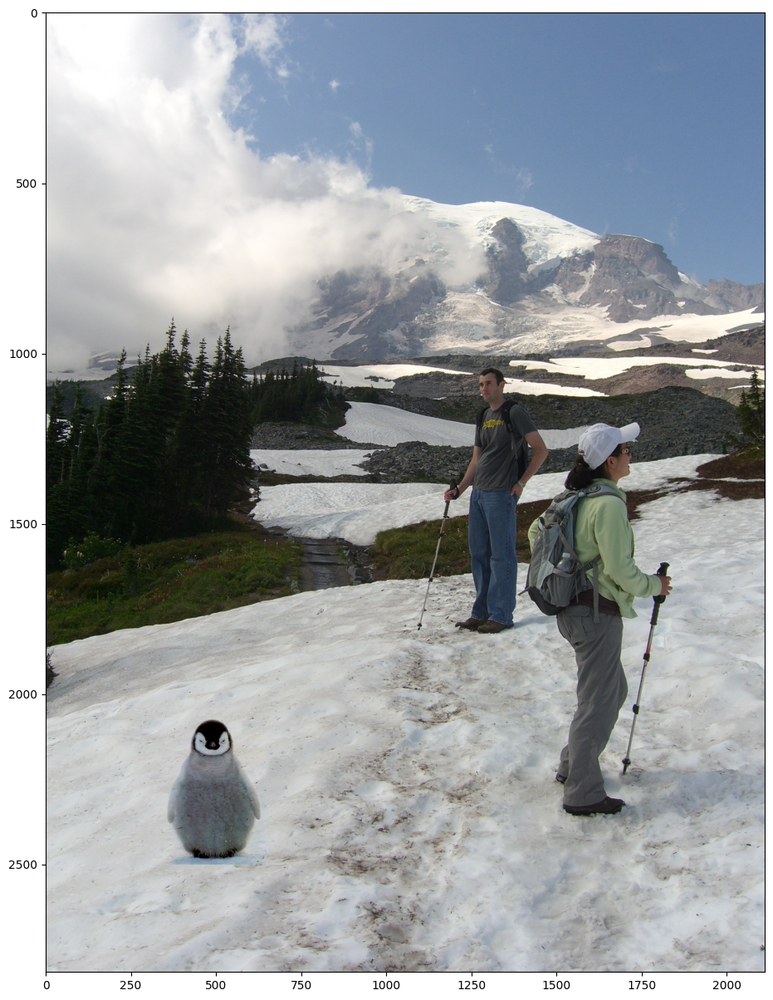

In [17]:
im_mix = np.zeros(background_img.shape)
for b in np.arange(3):
  im_mix[:,:,b] = mixed_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_mix)

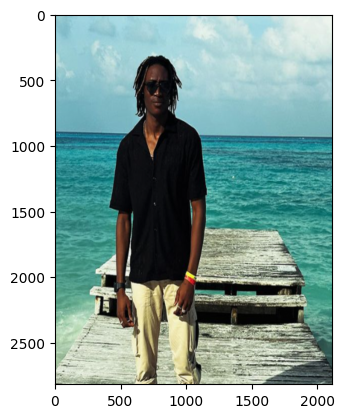

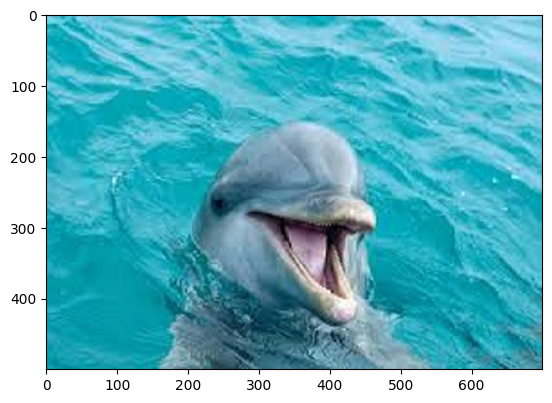

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.31999429308011607..1.0].


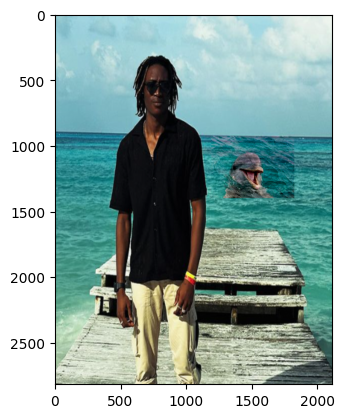

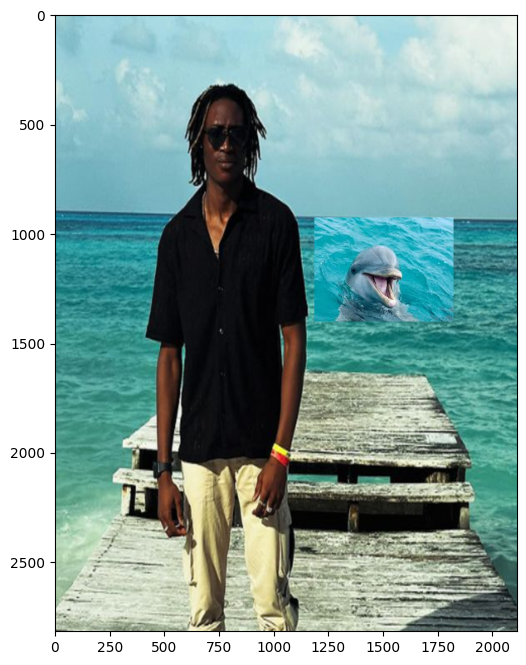

In [18]:
# own blend
background_img5 = cv2.cvtColor(cv2.imread('samples/meocean.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img5)
plt.show()
object_img5 = cv2.cvtColor(cv2.imread('samples/dolphin.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img5)
plt.show()

xs5 = (65, 700, 700, 65)
ys5 = (24, 24, 800, 800)
object_mask5 = utils.get_mask(ys5, xs5, object_img5)
bottom_center5 = (1500, 1400)  

object_img5, object_mask5 = utils.crop_object_img(object_img5, object_mask5)
bg_ul5 = utils.upper_left_background_rc(object_mask5, bottom_center5)

im_mix2 = np.zeros(background_img5.shape)
for b in np.arange(3):
  im_mix2[:,:,b] = mixed_blend(object_img5[:,:,b], object_mask5, background_img5[:,:,b].copy(), bg_ul5)
plt.imshow(im_mix2)

pasted_img5 = utils.get_combined_img(background_img5, object_img5, object_mask5, bg_ul5)
plt.figure(figsize=(8,8))
plt.imshow(pasted_img5)



# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [19]:
def color2gray(img):
    """
    Color image to grayscale convertor while keeping gradient.
    :param img: Input RGB image (HxWx3)
    :return: Grayscale image (HxW) 
    """
    #  grayscale image
    gray_im = np.mean(img, axis=2)
    gray_h, gray_w = gray_im.shape

    # gradients for R, G, B channels and grayscale 
    gradients = []
    for channel in range(3): 
        grad_x = np.diff(img[:, :, channel], axis=1)
        grad_y = np.diff(img[:, :, channel], axis=0)
        gradients.append((grad_x, grad_y))
    
    # grAY gradients
    gray_grad_x = np.diff(gray_im, axis=1)
    gray_grad_y = np.diff(gray_im, axis=0)

    grad_x_max = np.zeros_like(gray_grad_x)
    grad_y_max = np.zeros_like(gray_grad_y)

    for y in range(gray_h - 1):
        for x in range(gray_w - 1):
            # gradient magnitudes 
            gx_values = [gradients[c][0][y, x] for c in range(3)] + [gray_grad_x[y, x]]
            gy_values = [gradients[c][1][y, x] for c in range(3)] + [gray_grad_y[y, x]]
            
            grad_x_max[y, x] = max(gx_values, key=abs)
            grad_y_max[y, x] = max(gy_values, key=abs)

    # linear system
    num = gray_h * gray_w
    A = scipy.sparse.lil_matrix((2 * num + 1, num), dtype=np.float32)
    b = np.zeros(2 * num + 1, dtype=np.float32)

    e = 0
    for y in range(gray_h):
        for x in range(gray_w):
            ind = y * gray_w + x
            # x
            if x < gray_w - 1: 
                A[e, ind] = 1
                A[e, ind + 1] = -1
                b[e] = grad_x_max[y, x]
                e += 1
            #y
            if y < gray_h - 1: 
                A[e, ind] = 1
                A[e, ind + gray_w] = -1
                b[e] = grad_y_max[y, x]
                e += 1

    # edge
    A[e, 0] = 1
    b[e] = gray_im[0, 0]

    # lsqr
    res = scipy.sparse.linalg.lsqr(A.tocsr(), b)[0].reshape((gray_h, gray_w))
    return res

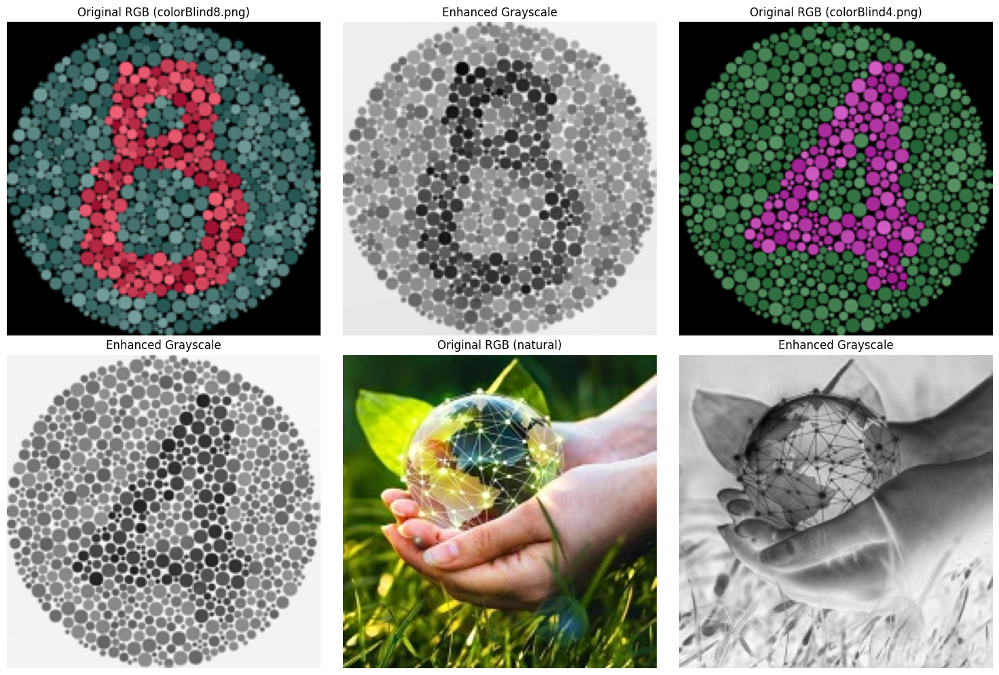

In [22]:
# testing
colorblind_img1 = cv2.cvtColor(cv2.imread('samples/colorBlind8.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
colorblind_img2 = cv2.cvtColor(cv2.imread('samples/colorBlind4.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
colorblind_img3 = cv2.cvtColor(cv2.imread('samples/natural.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0

# grayscale images
enhanced_gray1 = color2gray(colorblind_img1)
enhanced_gray2 = color2gray(colorblind_img2)
enhanced_gray3 = color2gray(colorblind_img3)

plt.figure(figsize=(15, 10))

# colorBlind8.png
plt.subplot(2, 3, 1)
plt.imshow(colorblind_img1)
plt.title("Original RGB (colorBlind8.png)")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(enhanced_gray1, cmap='gray')
plt.title("Enhanced Grayscale")
plt.axis('off')

# colorBlind4.png
plt.subplot(2, 3, 3)
plt.imshow(colorblind_img2)
plt.title("Original RGB (colorBlind4.png)")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(enhanced_gray2, cmap='gray')
plt.title("Enhanced Grayscale")
plt.axis('off')

# natural image
plt.subplot(2, 3, 5)
plt.imshow(colorblind_img3)
plt.title("Original RGB (natural)")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(enhanced_gray3, cmap='gray')
plt.title("Enhanced Grayscale")
plt.axis('off')

plt.tight_layout()
plt.show()

## Laplacian pyramid blending (20 pts)

In [21]:
def laplacian_blend(object_img, object_mask, bg_img, bg_ul):
  # feel free to change input parameters
    pass

## More gradient domain processing (up to 20 pts)